In [2]:
!pip uninstall -y onnxruntime onnxruntime-gpu

!pip install -q \
onnxruntime-gpu==1.22.0 \
insightface==0.7.3

Found existing installation: onnxruntime-gpu 1.26.0
Uninstalling onnxruntime-gpu-1.26.0:
  Successfully uninstalled onnxruntime-gpu-1.26.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 439.5/439.5 kB 8.4 MB/s eta 0:00:00a 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 283.2/283.2 MB 6.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 6.7 MB/s eta 0:00:00


In [3]:
import onnxruntime as ort
print(ort.get_available_providers())

['TensorrtExecutionProvider', 'CUDAExecutionProvider', 'CPUExecutionProvider']


In [4]:
-q optuna

In [71]:
import os
import random
import numpy as np
import pandas as pd
from tqdm import tqdm
from enum import Enum

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

import cv2

import optuna

from insightface.app import FaceAnalysis

SEED = 42

def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

seed_everything(SEED)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("DEVICE:", DEVICE)

DEVICE: cuda


In [7]:
# UTKFace
UTK_DATASET_PATH = "/kaggle/input/datasets/jangedoo/utkface-new/UTKFace"

# Kaggle dataset
KAGGLE_DATASET_PATH = "/kaggle/input/datasets/aadyasingh55/face-age-gender-dataset/face_dataset"
KAGGLE_TRAIN_CSV = "/kaggle/input/datasets/aadyasingh55/face-age-gender-dataset/face_dataset/train.csv"

IMG_SIZE = 112
EMBED_DIM = 512

BATCH_SIZE = 256
EPOCHS = 10

AGE_LABELS = [
    "<18",
    "18-24",
    "25-34",
    "35-44",
    "45-54",
    "55-64",
    "65+"
]

NUM_AGE = len(AGE_LABELS)
NUM_GENDER = 2

In [8]:
def age_to_label(age):

    if age < 18:
        return 0

    elif age <= 24:
        return 1

    elif age <= 34:
        return 2

    elif age <= 44:
        return 3

    elif age <= 54:
        return 4

    elif age <= 64:
        return 5

    else:
        return 6

In [9]:
def load_utkface_dataframe(dataset_path):

    records = []

    for fname in os.listdir(dataset_path):

        if not fname.endswith(".jpg"):
            continue

        try:
            age, gender = fname.split("_")[:2]

            age = int(age)
            gender = int(gender)

            if gender not in [0, 1]:
                continue

            records.append({
                "image_path": os.path.join(dataset_path, fname),
                "age_label": age_to_label(age),
                "gender_label": gender
            })

        except:
            continue

    return pd.DataFrame(records)

utk_df = load_utkface_dataframe(UTK_DATASET_PATH)

print("UTK:", len(utk_df))

UTK: 23708


In [10]:
def load_kaggle_dataframe(csv_path, root_dir):

    df = pd.read_csv(csv_path)

    df["image_path"] = df["full_path"].apply(
        lambda x: os.path.join(root_dir, x)
    )

    df["age_label"] = df["age"].apply(age_to_label)

    df["gender_label"] = df["gender"].astype(int)

    return df[["image_path", "age_label", "gender_label"]]

kaggle_df = load_kaggle_dataframe(
    KAGGLE_TRAIN_CSV,
    KAGGLE_DATASET_PATH
)

print("Kaggle:", len(kaggle_df))

Kaggle: 34708


In [11]:
combined_df = pd.concat(
    [utk_df, kaggle_df],
    ignore_index=True
)

combined_df = combined_df.sample(
    frac=1,
    random_state=SEED
).reset_index(drop=True)

train_df, test_df = train_test_split(
    combined_df,
    test_size=0.15,
    stratify=combined_df["age_label"],
    random_state=SEED
)

train_df, val_df = train_test_split(
    train_df,
    test_size=0.15,
    stratify=train_df["age_label"],
    random_state=SEED
)

print(len(train_df), len(val_df), len(test_df))

42205 7448 8763


In [12]:
import onnxruntime as ort

print(ort.get_available_providers())

['TensorrtExecutionProvider', 'CUDAExecutionProvider', 'CPUExecutionProvider']


In [14]:
from insightface.app import FaceAnalysis

app = FaceAnalysis(
    name="buffalo_l",
    providers=["CUDAExecutionProvider"]
)

app.prepare(ctx_id=0)

download_path: /root/.insightface/models/buffalo_l


100%|██████████| 281857/281857 [00:02<00:00, 99576.50KB/s] 


Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}, 'CUDAExecutionProvider': {'sdpa_kernel': '0', 'use_tf32': '1', 'fuse_conv_bias': '0', 'prefer_nhwc': '0', 'tunable_op_max_tuning_duration_ms': '0', 'enable_skip_layer_norm_strict_mode': '0', 'tunable_op_tuning_enable': '0', 'tunable_op_enable': '0', 'use_ep_level_unified_stream': '0', 'device_id': '0', 'has_user_compute_stream': '0', 'gpu_external_empty_cache': '0', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'cudnn_conv1d_pad_to_nc1d': '0', 'gpu_mem_limit': '18446744073709551615', 'gpu_external_alloc': '0', 'gpu_external_free': '0', 'arena_extend_strategy': 'kNextPowerOfTwo', 'do_copy_in_default_stream': '1', 'enable_cuda_graph': '0', 'user_compute_stream': '0', 'cudnn_conv_use_max_workspace': '1'}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with o

In [17]:
def extract_embedding(img_path):

    img = cv2.imread(img_path)

    if img is None:
        return None

    img = cv2.resize(img, (640, 640))  # IMPORTANT SPEED + STABILITY

    faces = app.get(img)

    if len(faces) == 0:
        return None

    return faces[0].embedding

In [18]:
def build_embeddings(df):

    embeddings = []
    age_labels = []
    gender_labels = []

    for row in tqdm(df.itertuples(index=False), total=len(df)):

        emb = extract_embedding(row.image_path)

        if emb is None:
            continue

        embeddings.append(emb)
        age_labels.append(row.age_label)
        gender_labels.append(row.gender_label)

    embeddings = np.stack(embeddings).astype(np.float32)
    age_labels = np.array(age_labels, dtype=np.int64)
    gender_labels = np.array(gender_labels, dtype=np.int64)

    return embeddings, age_labels, gender_labels

In [19]:
, y_age_train, y_gender_train = build_embeddings(train_df)

X_val, y_age_val, y_gender_val = build_embeddings(val_df)

X_test, y_age_test, y_gender_test = build_embeddings(test_df)

100%|██████████| 8763/8763 [04:22<00:00, 33.43it/s]


In [20]:
import numpy as np

np.savez(
    "train_embeddings.npz",
    X=X_train,
    y_age=y_age_train,
    y_gender=y_gender_train
)

np.savez(
    "val_embeddings.npz",
    X=X_val,
    y_age=y_age_val,
    y_gender=y_gender_val
)

np.savez(
    "test_embeddings.npz",
    X=X_test,
    y_age=y_age_test,
    y_gender=y_gender_test
)

print("Saved all embeddings successfully")

Saved all embeddings successfully


In [22]:
import torch
import torch.nn as nn

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"


class MultiTaskMLP(nn.Module):

    def __init__(self, hidden_dim=512, dropout=0.3):

        super().__init__()

        self.shared = nn.Sequential(
            nn.Linear(512, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),

            nn.Linear(hidden_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
        )

        self.age_head = nn.Linear(hidden_dim, NUM_AGE)
        self.gender_head = nn.Linear(hidden_dim, NUM_GENDER)

    def forward(self, x):

        x = self.shared(x)

        age_logits = self.age_head(x)
        gender_logits = self.gender_head(x)

        return age_logits, gender_logits

In [23]:
import numpy as np
from torch.utils.data import Dataset, DataLoader


class EmbeddingDataset(Dataset):

    def __init__(self, X, y_age, y_gender):

        self.X = torch.tensor(X, dtype=torch.float32)
        self.y_age = torch.tensor(y_age, dtype=torch.long)
        self.y_gender = torch.tensor(y_gender, dtype=torch.long)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y_age[idx], self.y_gender[idx]


def load_npz(path):

    data = np.load(path)

    return data["X"], data["y_age"], data["y_gender"]

In [24]:
, y_age_train, y_gender_train = load_npz("train_embeddings.npz")
X_val, y_age_val, y_gender_val = load_npz("val_embeddings.npz")

In [45]:
import torch.nn.functional as F


def train_model(model, train_loader, val_loader, lr=1e-3, weight_decay=1e-4):

    model = model.to(DEVICE)

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=lr,
        weight_decay=weight_decay
    )

    age_loss_fn = nn.CrossEntropyLoss()
    gender_loss_fn = nn.CrossEntropyLoss()

    scaler = torch.cuda.amp.GradScaler()

    for epoch in range(5):  # keep small for Optuna speed

        model.train()

        for x, y_age, y_gender in train_loader:

            x = x.to(DEVICE)
            y_age = y_age.to(DEVICE)
            y_gender = y_gender.to(DEVICE)

            optimizer.zero_grad()

            with torch.cuda.amp.autocast():

                age_logits, gender_logits = model(x)

                loss_age = age_loss_fn(age_logits, y_age)
                loss_gender = gender_loss_fn(gender_logits, y_gender)

                loss = 0.7 * loss_age + 0.3 * loss_gender

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

    # validation score
    model.eval()

    correct_age = 0
    correct_gender = 0
    total = 0

    with torch.no_grad():
        for x, y_age, y_gender in val_loader:

            x = x.to(DEVICE)

            age_logits, gender_logits = model(x)

            pred_age = age_logits.argmax(1).cpu()
            # pred_gender = gender_logits.argmax(1).cpu()
            gender_probs = torch.softmax(gender_logits, dim=1)

            gender_confidence, pred_gender = gender_probs.max(1)

            pred_gender = pred_gender.cpu()
            gender_confidence = gender_confidence.cpu()

            correct_age += (pred_age == y_age).sum().item()
            correct_gender += (pred_gender == y_gender).sum().item()

            total += y_age.size(0)

    age_acc = correct_age / total
    gender_acc = correct_gender / total

    return 0.7 * age_acc + 0.3 * gender_acc

In [46]:
import optuna


def objective(trial):

    hidden_dim = trial.suggest_categorical("hidden_dim", [256, 512, 768])
    dropout = trial.suggest_float("dropout", 0.2, 0.5)
    lr = trial.suggest_float("lr", 1e-4, 3e-3, log=True)
    weight_decay = trial.suggest_float("weight_decay", 1e-6, 1e-3, log=True)

    model = MultiTaskMLP(hidden_dim=hidden_dim, dropout=dropout)

    train_dataset = EmbeddingDataset(X_train, y_age_train, y_gender_train)
    val_dataset = EmbeddingDataset(X_val, y_age_val, y_gender_val)

    train_loader = DataLoader(train_dataset, batch_size=256, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=256)

    score = train_model(
        model,
        train_loader,
        val_loader,
        lr=lr,
        weight_decay=weight_decay
    )

    return score

In [48]:
study = optuna.create_study(direction="maximize")

study.optimize(objective, n_trials=10)  # KEEP SMALL FOR SPEED

print("Best params:", study.best_params)
print("Best score:", study.best_value)

[I 2026-05-26 08:11:06,173] A new study created in memory with name: no-name-a03174b8-c93a-4a81-b68a-aaaf71f8ab82
/tmp/ipykernel_57/2926508278.py:17: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
/tmp/ipykernel_57/2926508278.py:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
[I 2026-05-26 08:11:08,697] Trial 0 finished with value: 0.631121861322276 and parameters: {'hidden_dim': 768, 'dropout': 0.4139524679362352, 'lr': 0.00045981808268780714, 'weight_decay': 1.4086376486159259e-06}. Best is trial 0 with value: 0.631121861322276.
[I 2026-05-26 08:11:11,221] Trial 1 finished with value: 0.6458650080626585 and parameters: {'hidden_dim': 768, 'dropout': 0.26423437811603506, 'lr': 0.0007541522840793358, 'weight_decay': 3.4370527403787775e-05}. Best is trial 1 w

Best params: {'hidden_dim': 768, 'dropout': 0.26423437811603506, 'lr': 0.0007541522840793358, 'weight_decay': 3.4370527403787775e-05}
Best score: 0.6458650080626585


In [49]:
best = study.best_params

model = MultiTaskMLP(
    hidden_dim=best["hidden_dim"],
    dropout=best["dropout"]
)

In [50]:
model = MultiTaskMLP(
    hidden_dim=best["hidden_dim"],
    dropout=best["dropout"]
).to(DEVICE)

In [51]:
import numpy as np
from torch.utils.data import DataLoader

train = np.load("train_embeddings.npz")
val = np.load("val_embeddings.npz")

X_train, y_age_train, y_gender_train = train["X"], train["y_age"], train["y_gender"]
X_val, y_age_val, y_gender_val = val["X"], val["y_age"], val["y_gender"]

In [52]:
train_loader = DataLoader(
    EmbeddingDataset(X_train, y_age_train, y_gender_train),
    batch_size=256,
    shuffle=True
)

val_loader = DataLoader(
    EmbeddingDataset(X_val, y_age_val, y_gender_val),
    batch_size=256,
    shuffle=False
)

In [53]:
import torch
import torch.nn as nn

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=best["lr"],
    weight_decay=best["weight_decay"]
)

age_loss_fn = nn.CrossEntropyLoss()
gender_loss_fn = nn.CrossEntropyLoss()

In [54]:
scaler = torch.amp.GradScaler("cuda")

EPOCHS = 25  # FINAL TRAINING (not optuna style)

for epoch in range(EPOCHS):

    model.train()
    total_loss = 0

    for x, y_age, y_gender in train_loader:

        x = x.to(DEVICE)
        y_age = y_age.to(DEVICE)
        y_gender = y_gender.to(DEVICE)

        optimizer.zero_grad()

        with torch.amp.autocast("cuda"):

            age_logits, gender_logits = model(x)

            loss_age = age_loss_fn(age_logits, y_age)
            loss_gender = gender_loss_fn(gender_logits, y_gender)

            loss = 0.7 * loss_age + 0.3 * loss_gender

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        total_loss += loss.item()

    print(f"Epoch {epoch+1}/{EPOCHS} | Loss: {total_loss:.4f}")

Epoch 1/25 | Loss: 121.9442
Epoch 2/25 | Loss: 89.2667
Epoch 3/25 | Loss: 71.8341
Epoch 4/25 | Loss: 60.2218
Epoch 5/25 | Loss: 50.2409
Epoch 6/25 | Loss: 42.5965
Epoch 7/25 | Loss: 35.6915
Epoch 8/25 | Loss: 30.7606
Epoch 9/25 | Loss: 26.2824
Epoch 10/25 | Loss: 23.1323
Epoch 11/25 | Loss: 20.5364
Epoch 12/25 | Loss: 17.8823
Epoch 13/25 | Loss: 16.3906
Epoch 14/25 | Loss: 14.9282
Epoch 15/25 | Loss: 13.5356
Epoch 16/25 | Loss: 13.2098
Epoch 17/25 | Loss: 11.9803
Epoch 18/25 | Loss: 10.9300
Epoch 19/25 | Loss: 10.3830
Epoch 20/25 | Loss: 10.0415
Epoch 21/25 | Loss: 9.5470
Epoch 22/25 | Loss: 9.0040
Epoch 23/25 | Loss: 8.3749
Epoch 24/25 | Loss: 8.4218
Epoch 25/25 | Loss: 8.0531


In [55]:
model.eval()

correct_age = 0
correct_gender = 0
total = 0

with torch.no_grad():
    for x, y_age, y_gender in val_loader:

        x = x.to(DEVICE)

        age_logits, gender_logits = model(x)

        pred_age = age_logits.argmax(1).cpu()
        # pred_gender = gender_logits.argmax(1).cpu()
        gender_probs = torch.softmax(gender_logits, dim=1)

        gender_confidence, pred_gender = gender_probs.max(1)
        
        pred_gender = pred_gender.cpu()
        gender_confidence = gender_confidence.cpu()

        correct_age += (pred_age == y_age).sum().item()
        correct_gender += (pred_gender == y_gender).sum().item()

        total += y_age.size(0)

print("Age acc:", correct_age / total)
print("Gender acc:", correct_gender / total)

Age acc: 0.49896337249481687
Gender acc: 0.95922598479613


In [56]:
test = np.load("test_embeddings.npz")

X_test = test["X"]
y_age_test = test["y_age"]
y_gender_test = test["y_gender"]

In [57]:
test_loader = DataLoader(
    EmbeddingDataset(X_test, y_age_test, y_gender_test),
    batch_size=256,
    shuffle=False
)

In [58]:
model.eval()

correct_age = 0
correct_gender = 0
total = 0

with torch.no_grad():

    for x, y_age, y_gender in test_loader:

        x = x.to(DEVICE)

        age_logits, gender_logits = model(x)

        pred_age = age_logits.argmax(1).cpu()
        # pred_gender = gender_logits.argmax(1).cpu()
        gender_probs = torch.softmax(gender_logits, dim=1)

        gender_confidence, pred_gender = gender_probs.max(1)
        
        pred_gender = pred_gender.cpu()
        gender_confidence = gender_confidence.cpu()

        correct_age += (pred_age == y_age).sum().item()
        correct_gender += (pred_gender == y_gender).sum().item()

        total += y_age.size(0)

print("FINAL TEST AGE ACC:", correct_age / total)
print("FINAL TEST GENDER ACC:", correct_gender / total)

FINAL TEST AGE ACC: 0.48167641325536065
FINAL TEST GENDER ACC: 0.9567251461988304


In [59]:
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    ConfusionMatrixDisplay
)

import matplotlib.pyplot as plt

In [60]:
model.eval()

all_age_preds = []
all_age_true = []

all_gender_preds = []
all_gender_true = []

with torch.no_grad():

    for x, y_age, y_gender in test_loader:

        x = x.to(DEVICE)

        age_logits, gender_logits = model(x)

        pred_age = age_logits.argmax(1).cpu().numpy()
        # pred_gender = gender_logits.argmax(1).cpu().numpy()
        gender_probs = torch.softmax(gender_logits, dim=1)

        gender_confidence, pred_gender = gender_probs.max(1)
        
        pred_gender = pred_gender.cpu().numpy()
        gender_confidence = gender_confidence.cpu().numpy()

        all_age_preds.extend(pred_age)
        all_age_true.extend(y_age.numpy())

        all_gender_preds.extend(pred_gender)
        all_gender_true.extend(y_gender.numpy())

In [61]:
print(
    classification_report(
        all_age_true,
        all_age_preds,
        target_names=AGE_LABELS
    )
)

              precision    recall  f1-score   support

         <18       0.34      0.23      0.28       167
       18-24       0.53      0.54      0.54      1133
       25-34       0.53      0.56      0.55      1545
       35-44       0.41      0.38      0.40       802
       45-54       0.38      0.40      0.39       622
       55-64       0.37      0.34      0.35       435
         65+       0.56      0.58      0.57       426

    accuracy                           0.48      5130
   macro avg       0.45      0.43      0.44      5130
weighted avg       0.48      0.48      0.48      5130



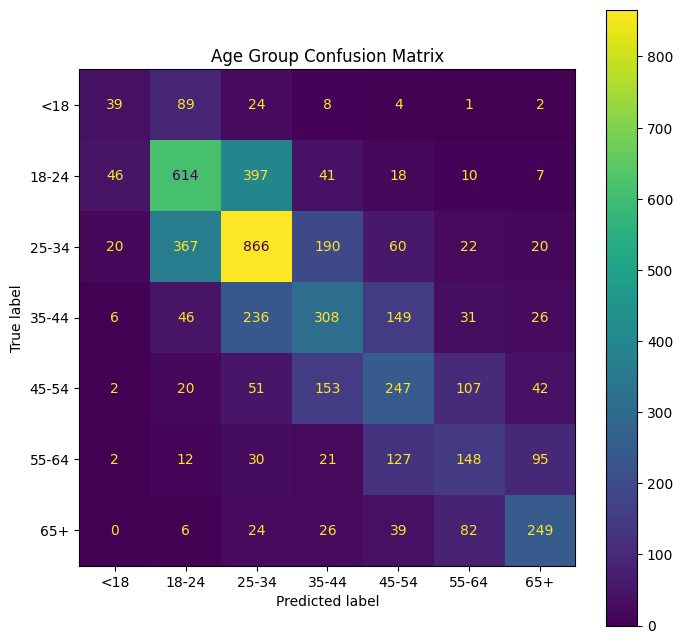

In [62]:
cm_age = confusion_matrix(all_age_true, all_age_preds)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm_age,
    display_labels=AGE_LABELS
)

fig, ax = plt.subplots(figsize=(8, 8))
disp.plot(ax=ax)

plt.title("Age Group Confusion Matrix")
plt.show()

In [63]:
GENDER_LABELS = ["Male", "Female"]

print(
    classification_report(
        all_gender_true,
        all_gender_preds,
        target_names=GENDER_LABELS
    )
)

              precision    recall  f1-score   support

        Male       0.90      0.92      0.91      1211
      Female       0.98      0.97      0.97      3919

    accuracy                           0.96      5130
   macro avg       0.94      0.94      0.94      5130
weighted avg       0.96      0.96      0.96      5130



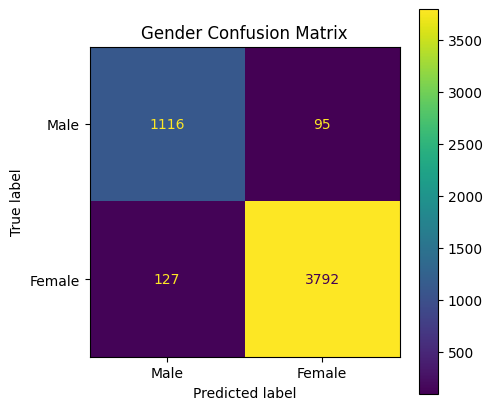

In [64]:
cm_gender = confusion_matrix(
    all_gender_true,
    all_gender_preds
)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm_gender,
    display_labels=GENDER_LABELS
)

fig, ax = plt.subplots(figsize=(5, 5))
disp.plot(ax=ax)

plt.title("Gender Confusion Matrix")
plt.show()

In [73]:

class InferenceStatus(Enum):
    """Enum for inference result statuses."""
    
    SUCCESS = "SUCCESS"
    NO_FACE = "NO_FACE_DETECTED"
    MULTIPLE_FACES = "MULTIPLE_FACES_DETECTED"
    IMAGE_LOAD_FAILED = "IMAGE_LOAD_FAILED"


In [79]:
def predict_image(img_path):
    """
    Predict age and gender from an image.
    
    Returns:
        dict: Status and prediction results with keys:
            - status (InferenceStatus): Result status
            - age_prediction (str): Age label (if SUCCESS)
            - age_confidence (float): Confidence score (if SUCCESS)
            - gender_prediction (str): Gender label (if SUCCESS)
            - gender_confidence (float): Confidence score (if SUCCESS)
    """
    
    img = cv2.imread(img_path)
    if img is None:
        return {"status": InferenceStatus.IMAGE_LOAD_FAILED}
    
    faces = app.get(img)
    
    # if len(faces) == 0:
    #     return {"status": InferenceStatus.NO_FACE}
    
    # if len(faces) > 1:
    #     return {"status": InferenceStatus.MULTIPLE_FACES}
    
    # embedding = faces[0].embedding

    if len(faces) == 0:
        return {"status": InferenceStatus.NO_FACE}

    # ✅ FIX: always take best face instead of rejecting multiple faces
    faces = sorted(faces, key=lambda x: x.det_score, reverse=True)
    face = faces[0]
    
    embedding = face.embedding
    
    x = torch.tensor(
        embedding,
        dtype=torch.float32
    ).unsqueeze(0).to(DEVICE)
    
    model.eval()
    
    with torch.no_grad():
        age_logits, gender_logits = model(x)
        
        # AGE
        age_probs = torch.softmax(age_logits, dim=1)
        age_confidence, pred_age = age_probs.max(1)
        
        # GENDER
        gender_probs = torch.softmax(gender_logits, dim=1)
        gender_confidence, pred_gender = gender_probs.max(1)
    
    # Move to CPU and convert to Python scalars
    pred_age_idx = pred_age.item()
    age_conf = age_confidence.item()
    pred_gender_idx = pred_gender.item()
    gender_conf = gender_confidence.item()
    
    # Print results for immediate feedback
    print("=" * 50)
    print("PREDICTED AGE:", AGE_LABELS[pred_age_idx])
    print("AGE CONFIDENCE:", round(age_conf, 4))
    print()
    print("PREDICTED GENDER:", "Male" if pred_gender_idx == 1 else "Female")
    print("GENDER CONFIDENCE:", round(gender_conf, 4))
    
    # Return structured response
    return {
        "status": InferenceStatus.SUCCESS,
        "age_prediction": AGE_LABELS[pred_age_idx],
        "age_confidence": age_conf,
        "gender_prediction": "Male" if pred_gender_idx == 1 else "Female",
        "gender_confidence": gender_conf
    }


In [86]:
predict_image("/kaggle/input/datasets/biggonibbo/car-img/car.jpg")

{'status': <InferenceStatus.NO_FACE: 'NO_FACE_DETECTED'>}

In [77]:
import os

folder = "/kaggle/input/datasets/biggonibbo/test-images/test_images"

for fname in os.listdir(folder):

    path = os.path.join(folder, fname)

    print("\nFILE:", fname)

    predict_image(path)


FILE: Dayahyang_46_1.webp
PREDICTED AGE: 25-34
AGE CONFIDENCE: 0.6339

PREDICTED GENDER: Male
GENDER CONFIDENCE: 0.9309

FILE: balen_36_1.jpg
PREDICTED AGE: 35-44
AGE CONFIDENCE: 0.9888

PREDICTED GENDER: Male
GENDER CONFIDENCE: 1.0

FILE: Dinesh_25_1.jpg

FILE: ananya_27_0.jpg
PREDICTED AGE: 25-34
AGE CONFIDENCE: 0.9847

PREDICTED GENDER: Female
GENDER CONFIDENCE: 0.9999

FILE: kumar_58_1.jpg
PREDICTED AGE: 45-54
AGE CONFIDENCE: 0.7277

PREDICTED GENDER: Male
GENDER CONFIDENCE: 0.9988

FILE: Abiral_23_1.jpg
PREDICTED AGE: 25-34
AGE CONFIDENCE: 0.5404

PREDICTED GENDER: Male
GENDER CONFIDENCE: 1.0

FILE: Sachdev_36_0.jpg
PREDICTED AGE: 25-34
AGE CONFIDENCE: 0.9843

PREDICTED GENDER: Female
GENDER CONFIDENCE: 0.99

FILE: jennifer_33_0.jpg
PREDICTED AGE: 25-34
AGE CONFIDENCE: 0.9623

PREDICTED GENDER: Female
GENDER CONFIDENCE: 0.9994

FILE: show_21_1.webp
PREDICTED AGE: 18-24
AGE CONFIDENCE: 0.9966

PREDICTED GENDER: Male
GENDER CONFIDENCE: 0.9999

FILE: Rajpal_55_1.jpeg
PREDICTED AGE: 

PREDICTED AGE: 25-34
AGE CONFIDENCE: 0.6339

PREDICTED GENDER: Male
GENDER CONFIDENCE: 0.9309
PREDICTED AGE: 35-44
AGE CONFIDENCE: 0.9888

PREDICTED GENDER: Male
GENDER CONFIDENCE: 1.0
PREDICTED AGE: 25-34
AGE CONFIDENCE: 0.6903

PREDICTED GENDER: Male
GENDER CONFIDENCE: 1.0
PREDICTED AGE: 25-34
AGE CONFIDENCE: 0.9847

PREDICTED GENDER: Female
GENDER CONFIDENCE: 0.9999
PREDICTED AGE: 45-54
AGE CONFIDENCE: 0.7277

PREDICTED GENDER: Male
GENDER CONFIDENCE: 0.9988
PREDICTED AGE: 25-34
AGE CONFIDENCE: 0.5404

PREDICTED GENDER: Male
GENDER CONFIDENCE: 1.0
PREDICTED AGE: 25-34
AGE CONFIDENCE: 0.9843

PREDICTED GENDER: Female
GENDER CONFIDENCE: 0.99
PREDICTED AGE: 25-34
AGE CONFIDENCE: 0.9623

PREDICTED GENDER: Female
GENDER CONFIDENCE: 0.9994
PREDICTED AGE: 18-24
AGE CONFIDENCE: 0.9966

PREDICTED GENDER: Male
GENDER CONFIDENCE: 0.9999
PREDICTED AGE: 45-54
AGE CONFIDENCE: 0.7501

PREDICTED GENDER: Male
GENDER CONFIDENCE: 0.9938
PREDICTED AGE: 18-24
AGE CONFIDENCE: 0.6484

PREDICTED GENDER: Fe

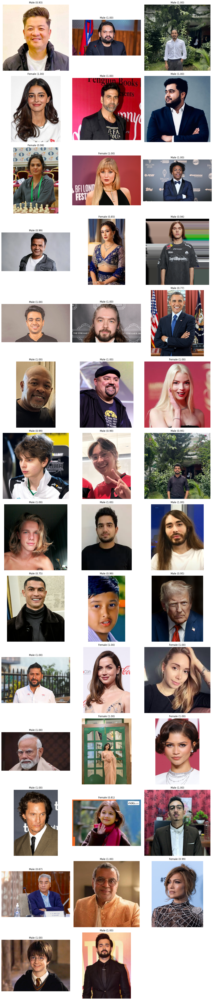

Saved to: /kaggle/working/gender_predictions.png


In [81]:
import os
import cv2
import math
import matplotlib.pyplot as plt

folder = "/kaggle/input/datasets/biggonibbo/test-images/test_images"

image_paths = [
    os.path.join(folder, f)
    for f in os.listdir(folder)
]

cols = 3
rows = math.ceil(len(image_paths) / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
axes = axes.flatten()

for idx, img_path in enumerate(image_paths):

    ax = axes[idx]

    img = cv2.imread(img_path)

    if img is None:
        ax.set_title("LOAD FAILED")
        ax.axis("off")
        continue

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    result = predict_image(img_path)

    ax.imshow(img)
    ax.axis("off")

    # ❌ handle failure cases
    if result["status"] != InferenceStatus.SUCCESS:
        ax.set_title(result["status"].value, fontsize=10)
        continue

    # ✅ ONLY gender + confidence
    gender = result["gender_prediction"]
    conf = result["gender_confidence"]

    ax.set_title(
        f"{gender} ({conf:.2f})",
        fontsize=12
    )

# hide empty plots
for i in range(len(image_paths), len(axes)):
    axes[i].axis("off")

plt.tight_layout()

# save output
out_path = "/kaggle/working/gender_predictions.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")

plt.show()

print("Saved to:", out_path)